# Visualization & Analysis of UHI Predictions

This notebook serves as the final presentation layer of the project. Here, we load the trained U-Net model and the processed dataset to generate high-quality visualizations.

**Objectives:**
1.  **Load the Trained Model:** Import the `best_unet_model.pth` weights.
2.  **Run Inference:** Generate predictions for specific years (e.g., 2023).
3.  **Visualize Results:** Create side-by-side comparisons of **Ground Truth (LST)**, **Model Prediction (Probability)**, and **Binary Risk Mask**.
4.  **Error Analysis:** Inspect where the model aligns with reality and where it diverges.

###  1. Loading Libraries

In [1]:
#!pip install geemap folium google-cloud-storage rasterio matplotlib localtileserver ipyleaflet  osmnx > /dev/null 2>&1
%pip install torch sklearn imageio

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from tqdm import tqdm

print("Libraries loaded successfully.")

Libraries loaded successfully.


### 2. Configuration & Path Setup

We define the directory structure relative to this notebook.
* **Data Source:** `data/processed/` (Input tensors)
* **Model Source:** `models/best_unet_model.pth` (Trained weights)
* **Output:** `maps/` (Where we save the final figures)

In [3]:
# --- CONFIGURATION ---

# 1. Get Project Root
# Assuming notebook is in 'notebooks/' folder, go up one level
PROJECT_ROOT = os.path.dirname(os.getcwd())

# 2. Define Paths
DATA_DIR = os.path.join(PROJECT_ROOT, 'data', 'processed')
MODEL_PATH = os.path.join(PROJECT_ROOT, 'models', 'best_unet_model.pth')
OUTPUT_DIR = os.path.join(PROJECT_ROOT, 'maps')

# Ensure output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 3. Device Setup (MPS for Mac, CUDA for Nvidia, CPU fallback)
if torch.backends.mps.is_available():
    DEVICE = "mps"
elif torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"

print(f"Visualization running on: {DEVICE}")
print(f"Model Path: {MODEL_PATH}")

Visualization running on: mps
Model Path: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/models/best_unet_model.pth


### 3. Load Trained U-Net Model

We initialize the custom U-Net architecture with **5 input channels** (NDVI, NDBI, Buildings, Roads, Water) and load the learned weights from the training phase.

In [4]:
# Add 'src' to python path to import our custom modules
sys.path.append(os.path.join(PROJECT_ROOT, 'src'))

from model import UNet

def load_model(model_path, device):
    """
    Loads the trained U-Net model in evaluation mode.
    """
    # Initialize model architecture (5 Input Channels -> 1 Output)
    model = UNet(n_channels=5, n_classes=1).to(device)
    
    try:
        # Load weights
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict)
        model.eval() # Important: Set to eval mode for consistent inference
        print("Model weights loaded successfully.")
        return model
    except Exception as e:
        print(f"Error loading model: {e}")
        return None

# Load the model globally
model = load_model(MODEL_PATH, DEVICE)

Model weights loaded successfully.


### 4. Define Inference Helper

Since we cannot feed the entire satellite image into the model at once (due to memory constraints), we use a **Patch-Based Inference** approach.
This function splits the large map into `256x256` tiles, predicts each tile, and stitches them back together.

In [5]:
def predict_year(year, model, data_dir, device, patch_size=256):
    """
    Loads data for a specific year, runs inference, and returns results.
    """
    file_path = os.path.join(data_dir, f"{year}.npy")
    if not os.path.exists(file_path):
        print(f"Data not found for year {year}")
        return None, None, None

    # Load Tensor: (6, H, W)
    full_data = np.load(file_path)
    
    # Split: Channel 0 is LST (Ground Truth), 1-5 are Features
    ground_truth = full_data[0]
    input_features = full_data[1:] # (5, H, W)
    
    # Dimensions
    channels, height, width = input_features.shape
    prediction_map = np.zeros((height, width), dtype=np.float32)
    
    print(f"Running inference for {year}...")
    
    # --- PATCHING LOOP ---
    for y in tqdm(range(0, height, patch_size)):
        for x in range(0, width, patch_size):
            y_end = min(y + patch_size, height)
            x_end = min(x + patch_size, width)
            
            # Handle edges by shifting back
            y_start = y
            x_start = x
            if (y_end - y_start) < patch_size: y_start = height - patch_size
            if (x_end - x_start) < patch_size: x_start = width - patch_size
            
            # Crop & Prepare Tensor
            patch = input_features[:, y_start:y_start+patch_size, x_start:x_start+patch_size]
            patch_tensor = torch.from_numpy(patch).unsqueeze(0).to(device, dtype=torch.float32)
            
            # Predict
            with torch.no_grad():
                output = model(patch_tensor)
                prob = torch.sigmoid(output).squeeze().cpu().numpy()
            
            # Stitch
            prediction_map[y_start:y_start+patch_size, x_start:x_start+patch_size] = prob
            
    return ground_truth, prediction_map

### 5. Run Inference on Test Year

We execute the prediction pipeline for a specific year from the validation set (e.g., 2023).
This enables us to compare the model's "hallucinated" heat map against the actual satellite thermal readings.

In [6]:
# --- EXECUTION ---
TEST_YEAR = 2023

print(f"Starting inference for year: {TEST_YEAR}")

# Run the helper function defined in the previous cell
# Returns:
# gt_lst: The actual Land Surface Temperature from satellite (Ground Truth)
# pred_map: The probability map generated by the U-Net (0.0 to 1.0)
gt_lst, pred_map = predict_year(TEST_YEAR, model, DATA_DIR, DEVICE)

if gt_lst is not None:
    print("Inference completed successfully.")
    print(f"Ground Truth Shape: {gt_lst.shape}")
    print(f"Prediction Shape: {pred_map.shape}")
    
    # Calculate simple statistics to verify range
    print(f"LST Range: {np.nanmin(gt_lst):.2f} to {np.nanmax(gt_lst):.2f}")
    print(f"Prediction Range: {pred_map.min():.4f} to {pred_map.max():.4f}")
else:
    print("Inference failed. Check data paths.")

Starting inference for year: 2023
Running inference for 2023...


100%|██████████| 14/14 [00:09<00:00,  1.41it/s]

Inference completed successfully.
Ground Truth Shape: (3344, 6681)
Prediction Shape: (3344, 6681)
LST Range: -13.55 to 52.92
Prediction Range: 0.0003 to 0.9990


### 6. Full Timeline Visualization & Error Analysis

Instead of analyzing a single year, we iterate through the entire dataset (2014-2024).
For each year, we generate a comprehensive 4-panel figure:
1.  **Ground Truth (LST):** The actual thermal satellite image.
2.  **Model Prediction:** The probability heatmap output by the U-Net.
3.  **Binary Risk Mask:** The final decision map (Threshold > 0.5).
4.  **Error Map:** Visualizing the discrepancy between normalized LST and prediction.

This allows us to validate the model's consistency across different years and atmospheric conditions.

Generating analysis figures for: [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]


  0%|          | 0/11 [00:00<?, ?it/s]

Running inference for 2014...


100%|██████████| 14/14 [00:09<00:00,  1.50it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2014.png


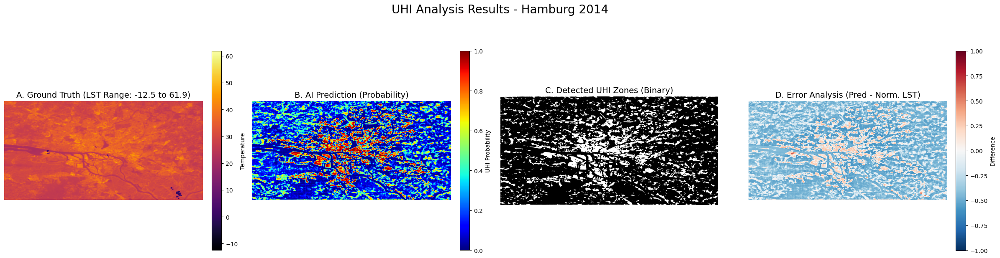

  9%|▉         | 1/11 [00:13<02:19, 13.97s/it]

Running inference for 2015...


100%|██████████| 14/14 [00:09<00:00,  1.46it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2015.png


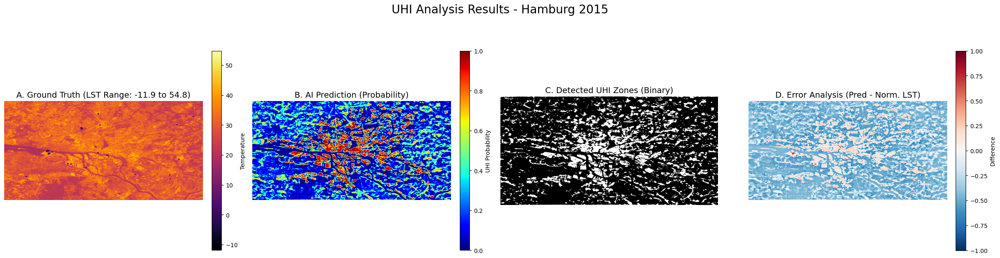

 18%|█▊        | 2/11 [00:28<02:08, 14.30s/it]

Running inference for 2016...


100%|██████████| 14/14 [00:09<00:00,  1.45it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2016.png


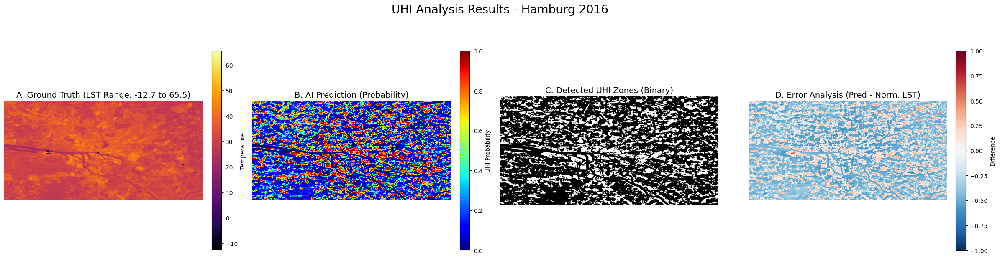

 27%|██▋       | 3/11 [00:42<01:54, 14.37s/it]

Running inference for 2017...


100%|██████████| 14/14 [00:09<00:00,  1.46it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2017.png


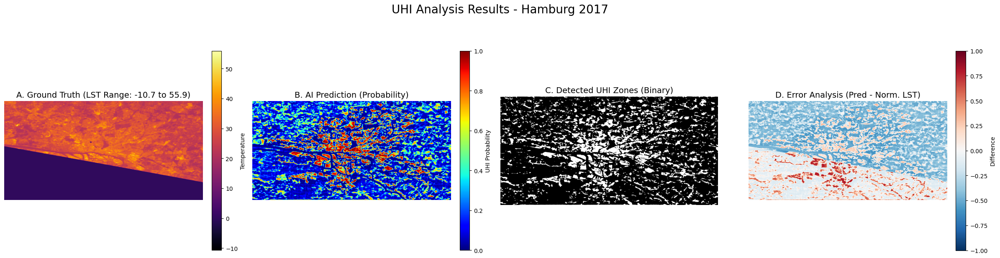

 36%|███▋      | 4/11 [00:57<01:40, 14.34s/it]

Running inference for 2018...


100%|██████████| 14/14 [00:09<00:00,  1.50it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2018.png


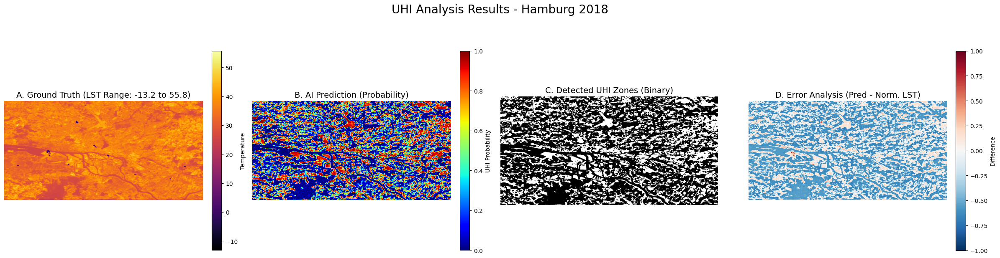

 45%|████▌     | 5/11 [01:11<01:25, 14.19s/it]

Running inference for 2019...


100%|██████████| 14/14 [00:09<00:00,  1.51it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2019.png


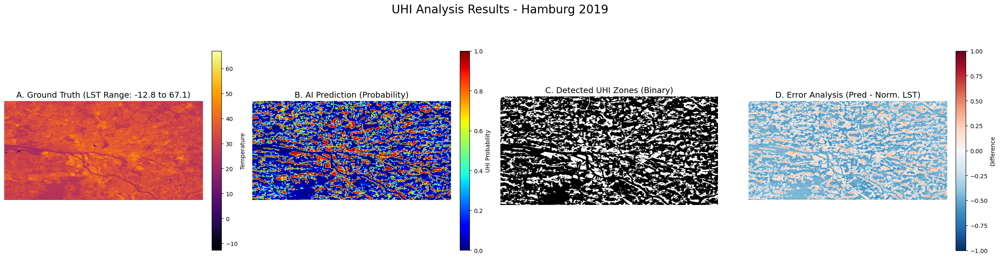

 55%|█████▍    | 6/11 [01:24<01:10, 14.06s/it]

Running inference for 2020...


100%|██████████| 14/14 [00:09<00:00,  1.51it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2020.png


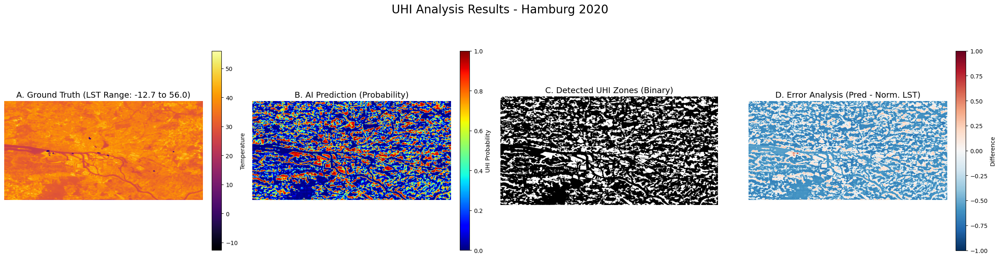

 64%|██████▎   | 7/11 [01:38<00:56, 14.01s/it]

Running inference for 2021...


100%|██████████| 14/14 [00:09<00:00,  1.50it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2021.png


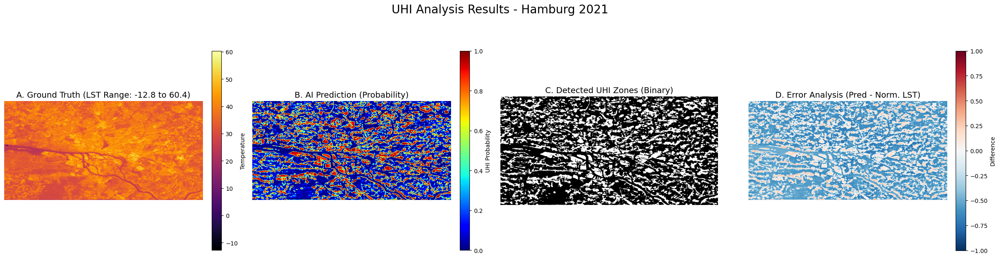

 73%|███████▎  | 8/11 [01:52<00:41, 13.97s/it]

Running inference for 2022...


100%|██████████| 14/14 [00:09<00:00,  1.51it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2022.png


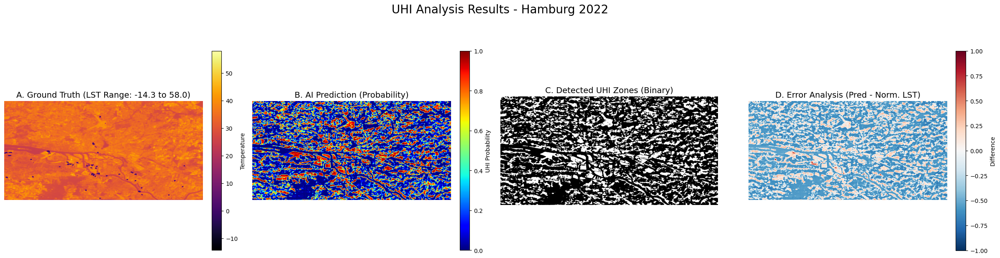

 82%|████████▏ | 9/11 [02:06<00:27, 13.94s/it]

Running inference for 2023...


100%|██████████| 14/14 [00:09<00:00,  1.51it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2023.png


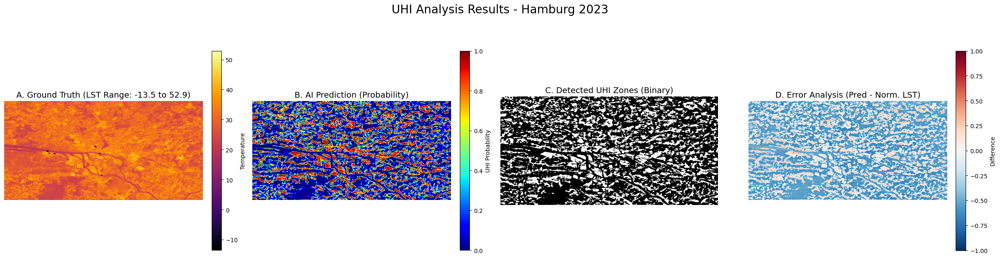

 91%|█████████ | 10/11 [02:20<00:13, 13.92s/it]

Running inference for 2024...


100%|██████████| 14/14 [00:09<00:00,  1.51it/s]


Figure saved: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/analysis_2024.png


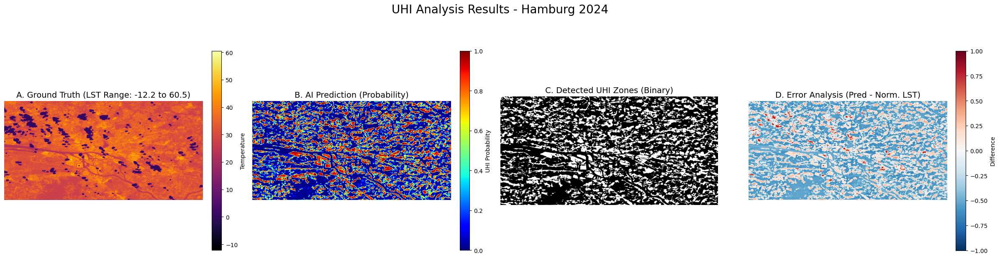

100%|██████████| 11/11 [02:34<00:00, 14.04s/it]


In [7]:
# --- 6. VISUALIZATION & ERROR ANALYSIS (ALL YEARS) ---

def plot_results(lst, prediction, year):
    """
    Creates a high-quality figure comparing Ground Truth, Prediction, and Error.
    Saves the figure to the output directory.
    """
    # 1. Create Binary Mask (Thresholding)
    binary_mask = (prediction > 0.5).astype(np.uint8)
    
    # 2. Normalize LST for comparison (0 to 1 scaling)
    # Handle NaNs effectively for visualization
    lst_min, lst_max = np.nanmin(lst), np.nanmax(lst)
    if lst_max == lst_min: # Avoid division by zero
        lst_norm = np.zeros_like(lst)
    else:
        lst_norm = (lst - lst_min) / (lst_max - lst_min)
    
    # 3. Calculate Error Map (Difference)
    # Positive: Model > Reality (Red), Negative: Model < Reality (Blue)
    diff_map = prediction - lst_norm

    # 4. Plotting
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    fig.suptitle(f"UHI Analysis Results - Hamburg {year}", fontsize=20, y=1.05)
    
    # Panel A: Ground Truth LST
    im0 = axes[0].imshow(lst, cmap='inferno')
    axes[0].set_title(f"A. Ground Truth (LST Range: {lst_min:.1f} to {lst_max:.1f})", fontsize=14)
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label="Temperature")
    
    # Panel B: AI Probability
    im1 = axes[1].imshow(prediction, cmap='jet', vmin=0, vmax=1)
    axes[1].set_title("B. AI Prediction (Probability)", fontsize=14)
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label="UHI Probability")
    
    # Panel C: Binary Risk Mask
    im2 = axes[2].imshow(binary_mask, cmap='gray')
    axes[2].set_title("C. Detected UHI Zones (Binary)", fontsize=14)
    axes[2].axis('off')
    
    # Panel D: Error Map (Difference)
    im3 = axes[3].imshow(diff_map, cmap='RdBu_r', vmin=-1, vmax=1)
    axes[3].set_title("D. Error Analysis (Pred - Norm. LST)", fontsize=14)
    axes[3].axis('off')
    plt.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04, label="Difference")
    
    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.join(OUTPUT_DIR, f"analysis_{year}.png")
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Figure saved: {save_path}")
    
    # Show only the last year inline to keep notebook clean, or remove 'if' to show all
    # if year == 2023: 
    plt.show()
    # else:
    #    plt.close() # Close plot to save memory

# --- BATCH EXECUTION ---
all_years = list(range(2014, 2025))

print(f"Generating analysis figures for: {all_years}")

for year in tqdm(all_years):
    gt, pred = predict_year(year, model, DATA_DIR, DEVICE)
    if gt is not None:
        plot_results(gt, pred, year)

### 7. Temporal Analysis (2014-2024)

To answer **RQ1 (Evolution)** and prepare for **RQ4 (Forecasting)**, we process the entire time-series dataset.
We calculate key metrics for each year:
1.  **UHI Area Percentage:** The proportion of the city classified as "High Risk" (Probability > 0.5).
2.  **Mean Temperature:** Average LST across the city (excluding cloud artifacts).

In [8]:
# --- 7. BULK ANALYSIS FOR ALL YEARS ---
import pandas as pd

# Define all years available in processed data
years = list(range(2014, 2025))
results_stats = []

print("Running bulk analysis for time-series extraction...")

for year in tqdm(years):
    # Run prediction using helper function (no image saving to speed up)
    gt, pred_map = predict_year(year, model, DATA_DIR, DEVICE)
    
    if gt is not None:
        # 1. Calculate UHI Risk Percentage
        # Pixels with probability > 0.5 are considered High Risk
        risk_pixels = np.sum(pred_map > 0.5)
        total_pixels = pred_map.size
        uhi_ratio = (risk_pixels / total_pixels) * 100
        
        # 2. Calculate Mean Temperature (Ground Truth LST)
        # Filter out extreme values (clouds/outliers) for cleaner stats
        valid_lst = gt[(gt > -10) & (gt < 60)] 
        mean_lst = np.mean(valid_lst) if valid_lst.size > 0 else 0
        
        results_stats.append({
            "Year": year,
            "UHI_Area_Pct": uhi_ratio,
            "Mean_LST": mean_lst
        })

# Create DataFrame
df_results = pd.DataFrame(results_stats)
print("\nTime-Series Data Extracted:")
print(df_results)

Running bulk analysis for time-series extraction...


  0%|          | 0/11 [00:00<?, ?it/s]

Running inference for 2014...


  9%|▉         | 1/11 [00:09<01:34,  9.42s/it]

Running inference for 2015...


 18%|█▊        | 2/11 [00:18<01:24,  9.37s/it]

Running inference for 2016...


 27%|██▋       | 3/11 [00:28<01:14,  9.34s/it]

Running inference for 2017...


 36%|███▋      | 4/11 [00:37<01:05,  9.36s/it]

Running inference for 2018...


 45%|████▌     | 5/11 [00:46<00:56,  9.36s/it]

Running inference for 2019...


 55%|█████▍    | 6/11 [00:56<00:46,  9.39s/it]

Running inference for 2020...


 64%|██████▎   | 7/11 [01:05<00:37,  9.38s/it]

Running inference for 2021...


 73%|███████▎  | 8/11 [01:14<00:28,  9.35s/it]

Running inference for 2022...


 82%|████████▏ | 9/11 [01:24<00:18,  9.33s/it]

Running inference for 2023...


 91%|█████████ | 10/11 [01:33<00:09,  9.32s/it]

Running inference for 2024...


100%|██████████| 11/11 [01:42<00:00,  9.34s/it]


Time-Series Data Extracted:
    Year  UHI_Area_Pct   Mean_LST
0   2014     21.200528  31.051702
1   2015     21.644366  29.563601
2   2016     30.250786  32.437817
3   2017     20.959799  18.251287
4   2018     37.578818  34.672760
5   2019     31.276158  33.145267
6   2020     32.530362  35.745865
7   2021     31.751122  36.688671
8   2022     32.094572  33.265198
9   2023     32.336725  30.600075
10  2024     31.297880  30.862127


In [9]:
# --- PRE-COMPUTE PREDICTIONS (OPTIONAL) ---
# This block ensures all years (2014-2024) are predicted and saved.
# Set RUN_PREDICTION = True if you want to regenerate all maps.

RUN_PREDICTION = False  # Set to True to run inference for all years

if RUN_PREDICTION:
    print("🚀 Generating prediction maps for all years...")
    all_years = list(range(2014, 2025))
    
    for year in tqdm(all_years):
        output_npy = os.path.join(PROJECT_ROOT, 'data', 'predictions', f'pred_{year}.npy')
        
        # Skip if exists to save time
        if not os.path.exists(output_npy):
            gt, pred_map = predict_year(year, model, DATA_DIR, DEVICE)
            if gt is not None:
                np.save(output_npy, pred_map)
    print("All predictions are ready.")
else:
    print("Skipping prediction generation (Using existing files).")

Skipping prediction generation (Using existing files).


### 8. RQ1 & RQ4: Evolution and Forecasting (2030)

Here we visualize the trend of UHI intensity over the last decade and project it into the future.

* **RQ1 (Evolution):** Plotting the historical rise/fall of risk areas.
* **RQ4 (Forecasting):** We apply a **Linear Regression model** to the historical data to predict the percentage of UHI-affected areas in **2030**, assuming current urbanization trends continue.

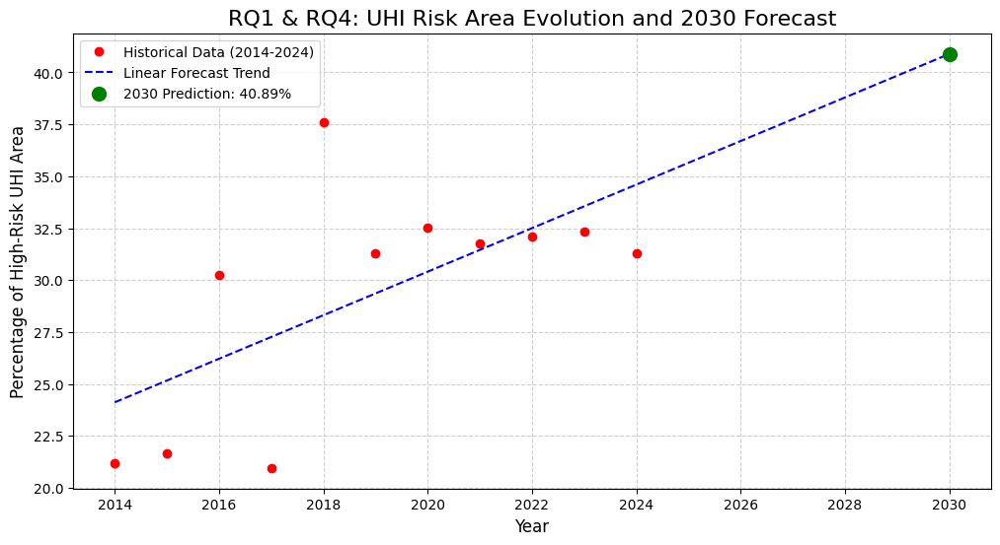

Projected UHI Risk Area in 2030: 40.89%


In [10]:
# --- 8. RQ1 & RQ4: TREND ANALYSIS & FORECASTING ---
from sklearn.linear_model import LinearRegression

# Prepare data for regression
X = df_results['Year'].values.reshape(-1, 1)
y = df_results['UHI_Area_Pct'].values

# Fit Linear Model
reg = LinearRegression().fit(X, y)

# Generate predictions for future years (up to 2030)
future_years = np.arange(2014, 2031).reshape(-1, 1)
future_pred = reg.predict(future_years)

# Plotting
plt.figure(figsize=(12, 6))

# 1. Historical Data (Dots)
plt.plot(df_results['Year'], df_results['UHI_Area_Pct'], 'ro', label='Historical Data (2014-2024)')

# 2. Trend Line (Daseld Line for Forecast)
plt.plot(future_years, future_pred, 'b--', label='Linear Forecast Trend')

# 3. Highlight 2030 Prediction
pred_2030 = future_pred[-1]
plt.scatter([2030], [pred_2030], color='green', s=100, zorder=5, label=f'2030 Prediction: {pred_2030:.2f}%')

# Styling
plt.title("RQ1 & RQ4: UHI Risk Area Evolution and 2030 Forecast", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Percentage of High-Risk UHI Area", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.xticks(np.arange(2014, 2031, 2)) # Show every 2 years

# Save
save_path = os.path.join(OUTPUT_DIR, "RQ4_2030_Forecast.png")
plt.savefig(save_path, dpi=300)
plt.show()

print(f"Projected UHI Risk Area in 2030: {pred_2030:.2f}%")

### 9. RQ2: Spatial Correlation Analysis

We investigate the statistical relationship between **Vegetation (NDVI)** and **Surface Temperature (LST)**.
By analyzing pixel-wise distribution, we aim to confirm the hypothesis that vegetation degradation leads to temperature increases.

Generating Correlation Plot...


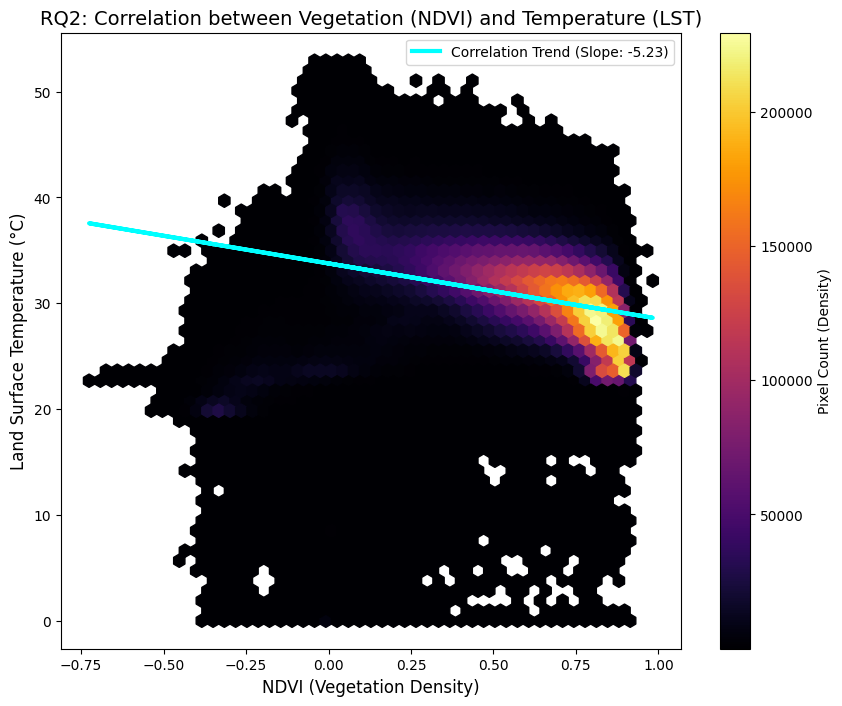

In [11]:
# --- 9. RQ2: CORRELATION PLOT (NDVI vs LST) ---
# Using 2023 data for detailed analysis
print("Generating Correlation Plot...")

# Load 2023 Data
file_path = os.path.join(DATA_DIR, "2023.npy")
full_data = np.load(file_path)

lst_flat = full_data[0].flatten()   # Channel 0: LST
ndvi_flat = full_data[1].flatten()  # Channel 1: NDVI

# Clean Data (Remove outliers/clouds/background)
valid_mask = (lst_flat > 0) & (ndvi_flat > -1) & (ndvi_flat < 1)
x = ndvi_flat[valid_mask]
y = lst_flat[valid_mask]

# Downsample for performance (Hexbin can handle large data, but scatter is slow)
# We use Hexbin plot which is best for dense data
plt.figure(figsize=(10, 8))
hb = plt.hexbin(x, y, gridsize=50, cmap='inferno', mincnt=1)
plt.colorbar(hb, label='Pixel Count (Density)')

# Add Regression Line (Trend)
m, b = np.polyfit(x, y, 1)
plt.plot(x, m*x + b, color='cyan', linewidth=3, label=f'Correlation Trend (Slope: {m:.2f})')

plt.title("RQ2: Correlation between Vegetation (NDVI) and Temperature (LST)", fontsize=14)
plt.xlabel("NDVI (Vegetation Density)", fontsize=12)
plt.ylabel("Land Surface Temperature (°C)", fontsize=12)
plt.legend()

save_path = os.path.join(OUTPUT_DIR, "RQ2_Correlation.png")
plt.savefig(save_path, dpi=300)
plt.show()

### 10. Advanced Interactive Time-Series Map

We generate a sophisticated **Time-Lapse Map** using Folium. This visualization allows to:
1.  **Slide through time (2014-2024):** Observe the evolution of UHI risk zones dynamically.
2.  **Toggle Base Maps:** Switch between a clean street map (CartoDB) and real satellite imagery (Esri World Imagery) to verify building footprints.
3.  **Visualize Intensity:** Instead of a binary mask, we display the **Probability Heatmap**. Darker red indicates higher confidence/risk, providing a nuanced view of thermal hotspots.

In [ ]:
import folium
from matplotlib import cm
import rasterio

def create_advanced_map():
    print("Generating Full Timeline Map (2014-2024)...")
    
    # 1. Geo-Reference (Using 2024 as base)
    ref_tif_path = os.path.join(PROJECT_ROOT, 'data', 'raw', 'sentinel_2', 'Hamburg_Composite_2024.tif')
    if not os.path.exists(ref_tif_path):
        ref_tif_path = os.path.join(PROJECT_ROOT, 'data', 'raw', 'sentinel_2', 'Hamburg_Composite_2023.tif')
    
    with rasterio.open(ref_tif_path) as src:
        bounds = src.bounds
        center_lat = (bounds.bottom + bounds.top) / 2
        center_lon = (bounds.left + bounds.right) / 2
        image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]

    # 2. Initialize Map
    m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles=None)
    
    # Add Base Maps
    folium.TileLayer('CartoDB positron', name='Clean Map (Gray)', show=True).add_to(m)
    folium.TileLayer(
        tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr='Esri',
        name='Satellite Imagery',
        show=False
    ).add_to(m)

    # 3. Add Layers for EACH Year
    timelapse_years = list(range(2014, 2025))
    
    for year in timelapse_years:
        pred_path = os.path.join(PROJECT_ROOT, 'data', 'predictions', f'pred_{year}.npy')
        
        if os.path.exists(pred_path):
            prediction = np.load(pred_path)
            
            # --- COLOR MAPPING ---
            rows, cols = prediction.shape
            colored_mask = np.zeros((rows, cols, 4), dtype=np.uint8)
            
            # Use 'YlOrRd' (Yellow-Orange-Red) colormap
            colormap = cm.get_cmap('YlOrRd')
            
            # Filter low probability (< 0.4) to define "Risk Zones"
            mask_indices = prediction > 0.4
            
            # Colorize
            colors = colormap(prediction[mask_indices])
            colored_mask[mask_indices, 0] = (colors[:, 0] * 255).astype(np.uint8)
            colored_mask[mask_indices, 1] = (colors[:, 1] * 255).astype(np.uint8)
            colored_mask[mask_indices, 2] = (colors[:, 2] * 255).astype(np.uint8)
            
            # Opacity (Alpha) - Make hotter areas more opaque
            colored_mask[mask_indices, 3] = (prediction[mask_indices] * 200).astype(np.uint8)

            # Add Layer
            # show=False makes them hidden by default, so you can toggle the year you want
            layer_name = f"Risk Map {year}"
            if year == 2024: show_layer = True # Only show 2024 by default
            else: show_layer = False
                
            folium.raster_layers.ImageOverlay(
                image=colored_mask,
                bounds=image_bounds,
                opacity=0.7,
                name=layer_name,
                show=show_layer
            ).add_to(m)
            
            print(f"Added layer: {year}")
    
    # 4. Add Control Panel
    folium.LayerControl(collapsed=False).add_to(m)
    
    save_path = os.path.join(PROJECT_ROOT, 'maps', 'interactive_uhi_map.html')
    m.save(save_path)
    print(f"\nMap saved to: {save_path}")

create_advanced_map()

Generating Full Timeline Map (2014-2024)...


/var/folders/_z/sc0jk_9x723gd8q1yqy_ts940000gn/T/ipykernel_45751/2227838669.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('YlOrRd')


Added layer: 2014
Added layer: 2015
Added layer: 2016
Added layer: 2017
Added layer: 2018
Added layer: 2019
Added layer: 2020
Added layer: 2021
Added layer: 2022
Added layer: 2023
Added layer: 2024

🌍 Map saved to: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/advanced_uhi_map.html


In [ ]:
import imageio
from PIL import Image

def create_gif():
    print("Generating Time-Lapse GIF...")
    images = []
    years = list(range(2014, 2025))
    
    output_gif = os.path.join(PROJECT_ROOT, 'maps', 'uhi_evolution.gif')
    
    # Create temp frame for each year
    for year in years:
        pred_path = os.path.join(PROJECT_ROOT, 'data', 'predictions', f'pred_{year}.npy')
        
        if os.path.exists(pred_path):
            pred = np.load(pred_path)
            
            # Plot frame (Minimalist)
            plt.figure(figsize=(10, 6))
            plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
            plt.title(f"Hamburg UHI Risk - {year}", fontsize=15, color='black')
            plt.axis('off')
            
            # Save frame to buffer/temp file
            frame_name = f"temp_{year}.png"
            plt.savefig(frame_name, bbox_inches='tight', dpi=100)
            plt.close()
            
            # Append to list
            images.append(imageio.imread(frame_name))
            os.remove(frame_name) # Clean up
            
    # Save GIF
    # duration=0.5 means 2 frames per second
    imageio.mimsave(output_gif, images, duration=0.8) 
    print(f"GIF saved to: {output_gif}")

create_gif()

Generating Time-Lapse GIF...


/var/folders/_z/sc0jk_9x723gd8q1yqy_ts940000gn/T/ipykernel_45751/468627793.py:31: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(frame_name))


GIF saved to: /Users/ozantuncbilek/Documents/Projects/UHI Detection and Analysis/urban-heat-island/maps/uhi_evolution.gif


### Future Outlook: 2030 Simulation Methodology

While we have successfully forecasted the **statistical trend** of UHI intensity for 2030 (see Section 8), generating a **spatial map** for a future year requires a different approach: **"Scenario-Based Simulation."**

Since a U-Net model operates on *Image-to-Image* translation, it requires input features (NDVI, NDBI) to generate an output (Temperature Risk). To create a 2030 map, we propose a simulation engine:

1.  **Define Scenarios:**
    * *Scenario A (Status Quo):* Extrapolate current urbanization rates to modify 2024 NDBI maps.
    * *Scenario B (Greening Strategy):* Simulate the addition of parks by artificially increasing NDVI values in targeted zones.
2.  **Synthetic Input Generation:**
    * Modify the 2024 tensor: `NDBI_2030 = NDBI_2024 * 1.1` (10% more concrete).
    * `NDVI_2030 = NDVI_2024 * 0.9` (10% less vegetation).
3.  **Inference:**
    * Feed this "Synthetic 2030 Tensor" into our trained U-Net.
    * **Output:** A predicted UHI Risk Map for 2030 under the defined scenario.

This methodology transforms the project from a **Monitoring Tool** into a **Predictive Planning Tool** for city officials.